In [710]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math

## Normaliserer data


In [711]:
df0109_1 = pd.read_csv('../data/split/no_plug/0109-1.csv')
df2106_3 = pd.read_csv('../data/split/no_plug/2106-3.csv')
df2906_1 = pd.read_csv('../data/split/no_plug/2906-1.csv')
df3006_1 = pd.read_csv('../data/split/no_plug/3006-1.csv')
df3006_2 = pd.read_csv('../data/split/no_plug/3006-2.csv')
df0404 = pd.read_csv('../data/split/no_plug/0404.csv')
df0712 = pd.read_csv('../data/split/no_plug/0712-2.csv')

df1803 = pd.read_csv('../data/split/partial_plug/1803.csv')
df1103 = pd.read_csv('../data/split/partial_plug/1103.csv')
df2503 = pd.read_csv('../data/split/partial_plug/2503.csv')
df2108_1 = pd.read_csv('../data/split/partial_plug/2108-1.csv')

df0709 = pd.read_csv('../data/split/plug/0709.csv')
df2106_1 = pd.read_csv('../data/split/plug/2106-1.csv')
df2106_2 = pd.read_csv('../data/split/plug/2106-2.csv')
df2108_2 = pd.read_csv('../data/split/plug/2108-2.csv')
df2401_1 = pd.read_csv('../data/split/plug/2401-1.csv')
df2401_2 = pd.read_csv('../data/split/plug/2401-2.csv')
df2906_2 = pd.read_csv('../data/split/plug/2906-2.csv')
df2906_3 = pd.read_csv('../data/split/plug/2906-3.csv')
df2906_4 = pd.read_csv('../data/split/plug/2906-4.csv')
df3006_3 = pd.read_csv('../data/split/plug/3006-3.csv')
df0612_1 = pd.read_csv('../data/split/plug/0612-1.csv')
df0612_2 = pd.read_csv('../data/split/plug/0612-2.csv')
df0612_3 = pd.read_csv('../data/split/plug/0612-3.csv')
df0707_1 = pd.read_csv('../data/split/plug/0707-1.csv')
df0707_2 = pd.read_csv('../data/split/plug/0707-2.csv')
df0707_3 = pd.read_csv('../data/split/plug/0707-3.csv')
df0707_4 = pd.read_csv('../data/split/plug/0707-4.csv')
df1112 = pd.read_csv('../data/split/plug/1112.csv')
df1310_1 = pd.read_csv('../data/split/plug/1310-1.csv')
df1310_2 = pd.read_csv('../data/split/plug/1310-2.csv')
df1310_3 = pd.read_csv('../data/split/plug/1310-3.csv')
df1407_1 = pd.read_csv('../data/split/plug/1407-1.csv')
df1407_2 = pd.read_csv('../data/split/plug/1407-2.csv')
df1407_3 = pd.read_csv('../data/split/plug/1407-3.csv')
df1407_4 = pd.read_csv('../data/split/plug/1407-4.csv')
df1503 = pd.read_csv('../data/split/plug/1503.csv')
df1811 = pd.read_csv('../data/split/plug/1811.csv')
df2701 = pd.read_csv('../data/split/plug/2701.csv')

In [712]:
dfs = [df0109_1, df1803, df2106_3, df2906_1, df3006_1, df3006_2, df0404, df0712, df1103, df2503, df0709, df2106_1, df2106_2, df2108_1, df2108_2, df2401_1, df2401_2, df2906_2, df2906_3, df2906_4, df3006_3, df0612_1, df0612_2, df0612_3, df0707_1, df0707_2, df0707_3, df0707_4, df1112, df1310_1, df1310_2, df1310_3, df1407_1, df1407_2, df1407_3, df1407_4, df1503, df1811, df2701]

dfnames = ['0109-1', '1803', '2106-3', '2906-1', '3006-1', '3006-2', '0404', '0712', '1103', '2503', '0709', '2106-1', '2106-2', '2108-1', '2108-2', '2401-1', '2401-2', '2906-2', '2906-3', '2906-4', '3006-3', '0612-1', '0612-2', '0612-3', '0707-1', '0707-2', '0707-3', '0707-4', '1112', '1310-1', '1310-2', '1310-3', '1407-1', '1407-2', '1407-3', '1407-4', '1503', '1811', '2701']

Tar en tilfeldig df og ser om kolonnene matcher med de andre, de som ikke matcher, legges til i en liste

In [713]:
not_matching = []
not_matching_names = []
for i in range (len(dfs)):
    if(df3006_2.columns.equals(dfs[i].columns)):
        continue
    else:
        not_matching.append(dfs[i])
        not_matching_names.append(dfnames[i])

In [714]:
df0712.drop(columns=['Temperature TS outlet (Std Dev)',
       'Temperature TS inlet (Std Dev)', 'Bypass temperature (Std Dev)',
       'Tank temperature (Std Dev)', 'Differential pressure (Std Dev)',
       'Pressure before pump (Std Dev)', 'Pressure after pump (Std Dev)',
       'Flow rate (Std Dev)'], inplace=True)

Sjekker om de mismatchende dfs matcher hverandre

In [715]:
for df in not_matching:
    print(df.columns == not_matching[0].columns)

[ True  True  True  True  True  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True]


In [716]:
print(not_matching_names)

['0109-1', '0712', '2108-1', '2108-2', '1112']


Mapper navn på kolonner slik at de matcher hverandre

In [717]:
mapping = {
        'Pressure before pump (Arith. Mean)': 'TS outlet pressure (Mean)',
        'Pressure after pump (Arith. Mean)': 'Pump outlet pressure (Mean)',
        'Differential pressure (Arith. Mean)': 'Differential pressure (Mean)',
        'Flow rate (Arith. Mean)': 'Flow rate (Mean)',
        'Tank temperature (Arith. Mean)': 'Tank temperature (Mean)',
        'Temperature TS inlet (Arith. Mean)': 'Temperature TS inlet (Mean)',
        'Temperature TS outlet (Arith. Mean)': 'Temperature TS outlet (Mean)',
        'Bypass temperature (Arith. Mean)': 'Bypass temperature (Mean)'
    }
df0109_1 = df0109_1.rename(columns=mapping)
df2108_1 = df2108_1.rename(columns=mapping)
df2108_2 = df2108_2.rename(columns=mapping)
df1112 = df1112.rename(columns=mapping)
df0712 = df0712.rename(columns=mapping)

Legger til en diff pressure kolonne i hver df

In [718]:
dfs = [df0109_1, df1803, df2106_3, df2906_1, df3006_1, df3006_2, df0404, df0712, df1103, 
       df2503, df0709, df2106_1, df2106_2, df2108_1, df2108_2, df2401_1, df2401_2, df2906_2, 
       df2906_3, df2906_4, df3006_3, df0612_1, df0612_2, df0612_3, df0707_1, df0707_2, df0707_3, 
       df0707_4, df1112, df1310_1, df1310_2, df1310_3, df1407_1, df1407_2, df1407_3, df1407_4, df1503, df1811, df2701]

for df in dfs:
    if 'TS inlet pressure (Mean)' in df.columns:
        df['Differential pressure (Mean)'] = df['TS inlet pressure (Mean)'] - df['TS outlet pressure (Mean)']
        df['Pump to inlet DP'] = df['Pump outlet pressure (Mean)'] - df['TS inlet pressure (Mean)']
        df['Total system DP'] = df['Pump outlet pressure (Mean)'] - df['TS outlet pressure (Mean)']
    else:
        df['TS inlet pressure (Mean)'] = df['TS outlet pressure (Mean)'] + df['Differential pressure (Mean)']
        df['Pump to inlet DP'] = df['Pump outlet pressure (Mean)'] - df['TS inlet pressure (Mean)']
        df['Total system DP'] = df['Pump outlet pressure (Mean)'] - df['TS outlet pressure (Mean)']

Fra unsupervised labeling har jeg måttet droppet noen dfs, dette er de resterende dfs jeg fortsatt kan bruke:

In [719]:
plug_dfs = [df0709, df2106_2, df2108_2, df2906_2, df2906_3, 
            df2906_4, df3006_3, df0612_2, df0612_3, df0707_1, df0707_2, df0707_4, df1112, 
            df1310_2, df1310_3, df1407_1, df1407_2, df1407_3, df1407_4, df1503, df1811, df2701]
#1003, bigplug
plug_names = [
            '0709', '2106-2', '2108-2', '2906-2', '2906-3',
            '2906-4', '3006-3', '0612-2', '0612-3', '0707-1', '0707-2', '0707-4', '1112', 
            '1310-2', '1310-3', '1407-1', '1407-2', '1407-3', '1407-4', '1503', '1811', '2701', '1003']

partial_plug_dfs = [df1803, df1103, df2503, df2108_1]
partial_plug_names = ['1803', '1103', '2503', '2108-1']

no_plug_dfs = [df2906_1, df3006_1, df3006_2, df0404, df0712]
# 1703, bignoplug
no_plug_names = ['2906-1', '3006-1', '3006-2', '0404', '0712', '1703']

Passer på at alle kolonnene er i samme rekkefølge i alle dfs

In [720]:
master_column_order = [
    'Time',
    'Temperature TS inlet (Mean)',
    'Temperature TS outlet (Mean)',
    'Tank temperature (Mean)',
    'Bypass temperature (Mean)',
    'Pump outlet pressure (Mean)',
    'TS inlet pressure (Mean)',
    'TS outlet pressure (Mean)',
    'Differential pressure (Mean)',
    'Pump to inlet DP',
    'Total system DP',
    'Flow rate (Mean)',
    'reading_interval_s',
    'elapsed_runtime_s'
]

In [721]:
plug_dfs[0].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1698 entries, 0 to 1697
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Time                          1698 non-null   object 
 1   Temperature TS outlet (Mean)  1698 non-null   float64
 2   Temperature TS inlet (Mean)   1698 non-null   float64
 3   Bypass temperature (Mean)     1698 non-null   float64
 4   Tank temperature (Mean)       1698 non-null   float64
 5   TS outlet pressure (Mean)     1698 non-null   float64
 6   TS inlet pressure (Mean)      1698 non-null   float64
 7   Pump outlet pressure (Mean)   1698 non-null   float64
 8   Flow rate (Mean)              1698 non-null   float64
 9   reading_interval_s            1698 non-null   float64
 10  elapsed_runtime_s             1698 non-null   float64
 11  elapsed_runtime_m             1698 non-null   float64
 12  Differential pressure (Mean)  1698 non-null   float64
 13  Pum

In [722]:
def standardize_sampling(df, target_freq='1s'):
    df = df.select_dtypes(include=['number'])

    df = df.groupby('elapsed_runtime_s').mean()
    
    df.index = pd.to_timedelta(df.index, unit='s')
    
    standardized_df = df.resample(target_freq).mean()
    
    standardized_df = standardized_df.interpolate(method='linear')
    
    standardized_df.index = standardized_df.index.total_seconds()
    standardized_df.index.name = 'elapsed_runtime_s'

    standardized_df = standardized_df.drop(columns=['reading_interval_s'])

    return standardized_df.reset_index()

In [723]:
standardized_plugs = []
standardized_no_plugs = []
standardized_partial_plugs = []
for df in plug_dfs:
    df_reordered = df[master_column_order].copy()
    df_ready = standardize_sampling(df_reordered)
    standardized_plugs.append(df_ready)

for df in partial_plug_dfs:
    df_reordered = df[master_column_order].copy()
    df_ready = standardize_sampling(df_reordered)
    standardized_partial_plugs.append(df_ready)

for df in no_plug_dfs:
    df_reordered = df[master_column_order].copy()
    df_ready = standardize_sampling(df_reordered)
    standardized_no_plugs.append(df_ready)

Sanity check at alle kolonnene er like i alle dfs

In [724]:
for df in standardized_no_plugs:
    if(standardized_no_plugs[0].columns != df.columns).any():
        print('Mismatch!')
for df in standardized_plugs:
    if(standardized_plugs[0].columns != df.columns).any():
        print('Mismatch!')
for df in standardized_partial_plugs:
    if(standardized_partial_plugs[0].columns != df.columns).any():
        print('Mismatch!')

## Legger til Big runs siden de ikke var med tidligere

In [725]:
df1 = pd.read_csv('../data/BigNoPlug/17-03-high_001.csv', sep=';', decimal=',')
df2 = pd.read_csv('../data/BigNoPlug/17-03-high_002.csv', sep=';', decimal=',')
df3 = pd.read_csv('../data/BigNoPlug/17-03-high_003.csv', sep=';', decimal=',')
df4 = pd.read_csv('../data/BigNoPlug/17-03-high_004.csv', sep=';', decimal=',')
df5 = pd.read_csv('../data/BigNoPlug/17-03-high_005.csv', sep=';', decimal=',')
df6 = pd.read_csv('../data/BigNoPlug/17-03-high_006.csv', sep=';', decimal=',')
df7 = pd.read_csv('../data/BigNoPlug/17-03-high_007.csv', sep=';', decimal=',')
df8 = pd.read_csv('../data/BigNoPlug/17-03-high_008.csv', sep=';', decimal=',')
df9 = pd.read_csv('../data/BigNoPlug/17-03-high_009.csv', sep=';', decimal=',')
df10 = pd.read_csv('../data/BigNoPlug/17-03-high_010.csv', sep=';', decimal=',')
df11 = pd.read_csv('../data/BigNoPlug/17-03-high_011.csv', sep=';', decimal=',')
df12 = pd.read_csv('../data/BigNoPlug/17-03-high_012.csv', sep=';', decimal=',')
df13 = pd.read_csv('../data/BigNoPlug/17-03-high_013.csv', sep=';', decimal=',')
df14 = pd.read_csv('../data/BigNoPlug/17-03-high_014.csv', sep=';', decimal=',')
df15 = pd.read_csv('../data/BigNoPlug/17-03-high_015.csv', sep=';', decimal=',')
df16 = pd.read_csv('../data/BigNoPlug/17-03-high_016.csv', sep=';', decimal=',')
df17 = pd.read_csv('../data/BigNoPlug/17-03-high_017.csv', sep=';', decimal=',')
df18 = pd.read_csv('../data/BigNoPlug/17-03-high_018.csv', sep=';', decimal=',')

plug_df1 = pd.read_csv('../data/BigPlug/10-03-high_001.csv', sep=';', decimal=',')
plug_df2 = pd.read_csv('../data/BigPlug/10-03-high_002.csv', sep=';', decimal=',')
plug_df3 = pd.read_csv('../data/BigPlug/10-03-high_003.csv', sep=';', decimal=',')
plug_df4 = pd.read_csv('../data/BigPlug/10-03-high_004.csv', sep=';', decimal=',')
plug_df5 = pd.read_csv('../data/BigPlug/10-03-high_005.csv', sep=';', decimal=',')
plug_df6 = pd.read_csv('../data/BigPlug/10-03-high_006.csv', sep=';', decimal=',')
plug_df7 = pd.read_csv('../data/BigPlug/10-03-high_007.csv', sep=';', decimal=',')
plug_df8 = pd.read_csv('../data/BigPlug/10-03-high_008.csv', sep=';', decimal=',')
plug_df9 = pd.read_csv('../data/BigPlug/10-03-high_009.csv', sep=';', decimal=',')
plug_df10 = pd.read_csv('../data/BigPlug/10-03-high_010.csv', sep=';', decimal=',')
plug_df11 = pd.read_csv('../data/BigPlug/10-03-high_011.csv', sep=';', decimal=',')
plug_df12 = pd.read_csv('../data/BigPlug/10-03-high_012.csv', sep=';', decimal=',')
plug_df13 = pd.read_csv('../data/BigPlug/10-03-high_013.csv', sep=';', decimal=',')
plug_df14 = pd.read_csv('../data/BigPlug/10-03-high_014.csv', sep=';', decimal=',')

In [726]:
no_plug_df_big = [df4, df5, df6, df7, df8, df9, df10, df11, df12, df13, df14, df15, df16, df17, df18]
plug_df_big = [plug_df4, plug_df5, plug_df6, plug_df7, plug_df8, plug_df9, plug_df10, plug_df11, plug_df12, plug_df13, plug_df14]

no_plug_df = pd.concat(no_plug_df_big, axis=0).reset_index(drop=True)
plug_df = pd.concat(plug_df_big, axis=0).reset_index(drop=True)

In [727]:
no_plug_df['Time'] = pd.to_datetime(no_plug_df['Time'].str.replace(',', '.'), format='%H:%M:%S.%f')
plug_df['Time'] = pd.to_datetime(plug_df['Time'].str.replace(',', '.'), format='%H:%M:%S.%f')

In [728]:
for df in [no_plug_df, plug_df]:
    df['Differential pressure (Mean)'] = df['TS inlet pressure (Mean)'] - df['TS outlet pressure (Mean)']
    df['Pump to inlet DP'] = df['Pump outlet pressure (Mean)'] - df['TS inlet pressure (Mean)']
    df['Total system DP'] = df['Pump outlet pressure (Mean)'] - df['TS outlet pressure (Mean)']

In [729]:
def sensor_reading_interval(df):
    out = df.copy()
    out["reading_interval_s"] = out['Time'].diff().dt.total_seconds().fillna(0)
    elapsed_runtime = out['Time'] - out['Time'].iloc[0]
    out["elapsed_runtime_s"] = elapsed_runtime.dt.total_seconds()
    return out

In [730]:
no_plug_df = sensor_reading_interval(no_plug_df)
plug_df = sensor_reading_interval(plug_df)

In [731]:
master_column_order = [
    'Time',
    'Temperature TS inlet (Mean)',
    'Temperature TS outlet (Mean)',
    'Tank temperature (Mean)',
    'Bypass temperature (Mean)',
    'Pump outlet pressure (Mean)',
    'TS inlet pressure (Mean)',
    'TS outlet pressure (Mean)',
    'Differential pressure (Mean)',
    'Pump to inlet DP',
    'Total system DP',
    'Flow rate (Mean)',
    'reading_interval_s',
    'elapsed_runtime_s'
    ]

In [732]:
reordered_plug_df = plug_df[master_column_order].copy()
reordered_no_plug_df = no_plug_df[master_column_order].copy()

In [733]:
reordered_plug = standardize_sampling(reordered_plug_df)
reordered_no_plug = standardize_sampling(reordered_no_plug_df)

In [734]:
standardized_plugs.append(reordered_plug)
standardized_no_plugs.append(reordered_no_plug)

## Manuel labeling

### functions

In [735]:
def add_rdd(df1):
    df = df1.copy()
    
    df['Pressure_Ratio'] = (df['TS inlet pressure (Mean)'] - df['TS outlet pressure (Mean)']) / \
                           (df['Pump outlet pressure (Mean)'] - df['TS inlet pressure (Mean)'] + 1e-6)

    base_ratio_val = df['Pressure_Ratio'].iloc[:60].median()
    
    df['Relative_Ratio_Dev'] = (df['Pressure_Ratio'] / (base_ratio_val + 1e-6) - 1).abs()

    df['run_specific_time_s'] = (df['elapsed_runtime_s'] - df['elapsed_runtime_s'].iloc[0])
    
    return df

In [736]:
def plot_rdd(df):
    fig, ax = plt.subplots(figsize=(16, 6))

    x_axis = df['run_specific_time_s']

    ax.plot(x_axis, df['Relative_Ratio_Dev'], color='skyblue', alpha=0.4, label='Raw Deviation')

    smoothed = df['Relative_Ratio_Dev'].rolling(window=10, min_periods=1).mean()
    ax.plot(x_axis, smoothed, color='darkblue', linewidth=2, label='Smoothed Trend')

    ax.set_title('Relative Ratio Deviation Over Time')
    ax.set_ylabel('Deviation Magnitude')
    ax.set_xlabel('Time (s)')
    ax.grid(True, which='both', linestyle='--', alpha=0.5)
    ax.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

In [737]:
def plot_section(df, start_time, end_time):
    mask = (df['run_specific_time_s'] >= start_time) & (df['run_specific_time_s'] <= end_time)
    df_section = df.loc[mask].copy()

    fig, ax = plt.subplots(figsize=(16, 6))

    x_axis = df_section['run_specific_time_s']
    ax.plot(x_axis, df_section['Relative_Ratio_Dev'], color='skyblue', alpha=0.4, label='Raw Deviation')

    smoothed = df_section['Relative_Ratio_Dev'].rolling(window=10, min_periods=1).mean()
    ax.plot(x_axis, smoothed, color='darkblue', linewidth=2, label='Smoothed Trend')

    ax.set_title(f'Relative Ratio Deviation (From {start_time}s to {end_time}s)')
    ax.set_ylabel('Deviation Magnitude')
    ax.set_xlabel('Time s')

    ax.set_xlim(start_time, end_time)
    
    ax.grid(True, which='both', linestyle='--', alpha=0.5)
    ax.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

In [738]:
def label_run(df, one, two, three):
    out = df.copy()
    out['label'] = 0
    if one != 0:
        out.loc[out['run_specific_time_s'] >= one, 'label'] = 1
    if two != 0:
        out.loc[out['run_specific_time_s'] >= two, 'label'] = 2
    if three != 0:
        out.loc[out['run_specific_time_s'] >= three, 'label'] = 3
    return out

In [739]:
def verify_labels(df):
    fig, ax = plt.subplots(figsize=(16, 6))
    
    x = df['run_specific_time_s']
    y = df['Relative_Ratio_Dev']
    
    ax.plot(x, y, color='black', alpha=0.3, label='Raw Signal')
    ax.plot(x, y.rolling(window=10).mean(), color='blue', linewidth=2, label='Smoothed Trend')

    colors = {1: 'yellow', 2: 'orange', 3: 'red'}
    labels_found = df['label'].unique()

    for lbl in [1, 2, 3]:
        if lbl in labels_found:
            lbl_time = df[df['label'] == lbl]['run_specific_time_s']
            ax.axvspan(lbl_time.min(), lbl_time.max(), color=colors[lbl], alpha=0.2, label=f'Label {lbl}')

    ax.set_title('Label Verification: Relative Ratio Deviation with State Shading')
    ax.set_ylabel('Deviation Magnitude')
    ax.set_xlabel('Time (s)')
    ax.legend(loc='upper left')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

### Plug runs

In [740]:
rdd_plugs = []
for df in standardized_plugs:
    rdd_plugs.append(add_rdd(df))


#### 0709

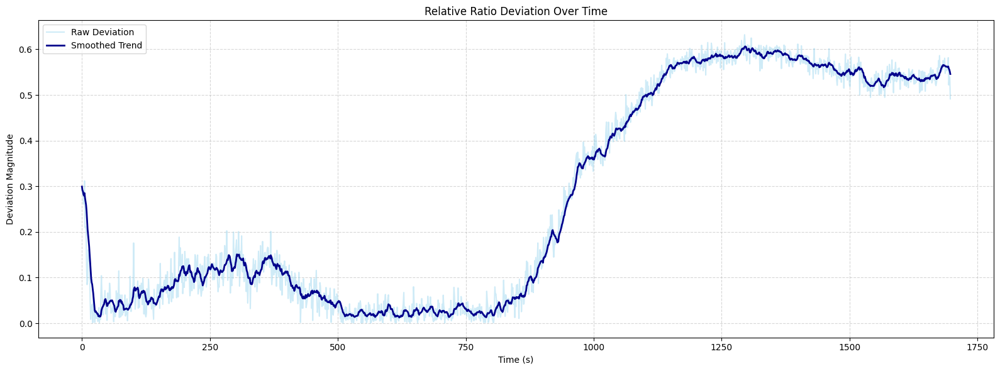

In [741]:
df = rdd_plugs[0]
plot_rdd(df)

In [742]:
df = label_run(df, 860, 930, 1170)

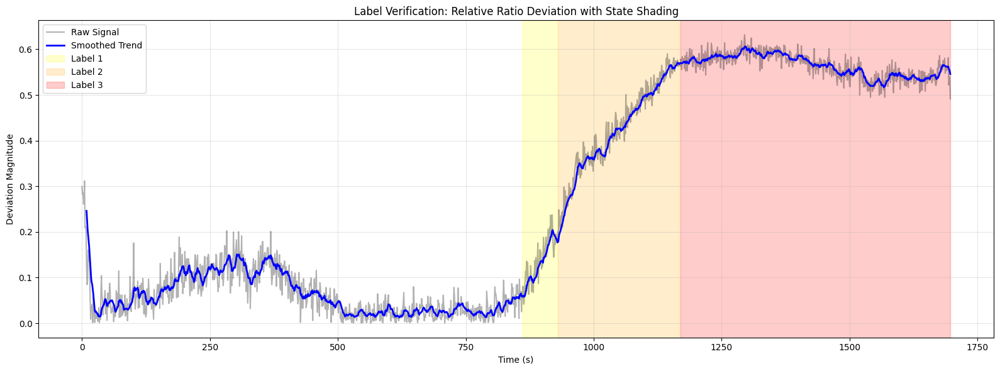

In [743]:
verify_labels(df)

In [744]:
df.to_csv('../data/labeled/plug/0709.csv', index=False)

#### 2106-2

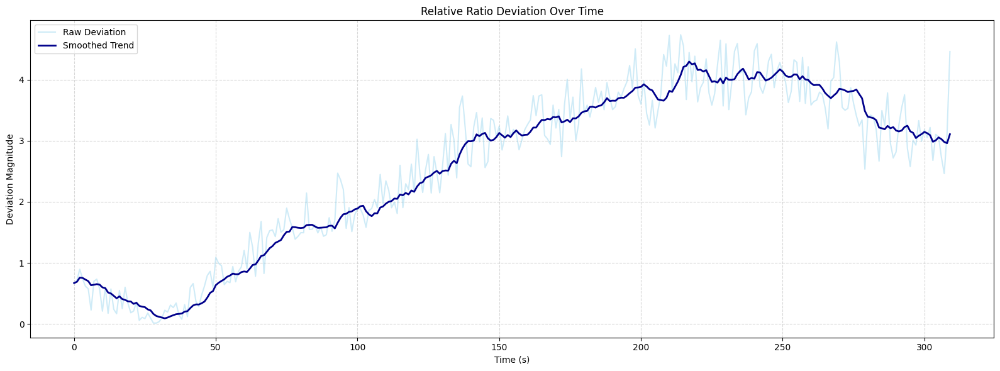

In [745]:
df = rdd_plugs[1]
plot_rdd(df)

In [746]:
df = label_run(df, 50, 80, 200)

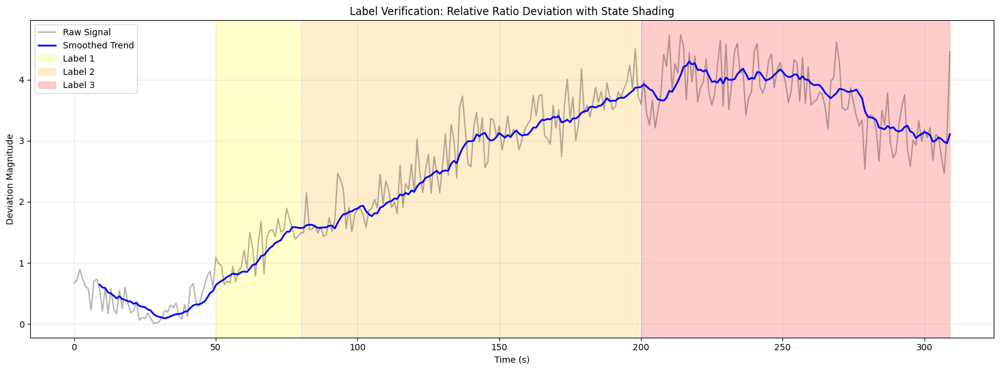

In [747]:
verify_labels(df)

In [748]:
df.to_csv('../data/labeled/plug/2106-2.csv', index=False)

#### 2108-2

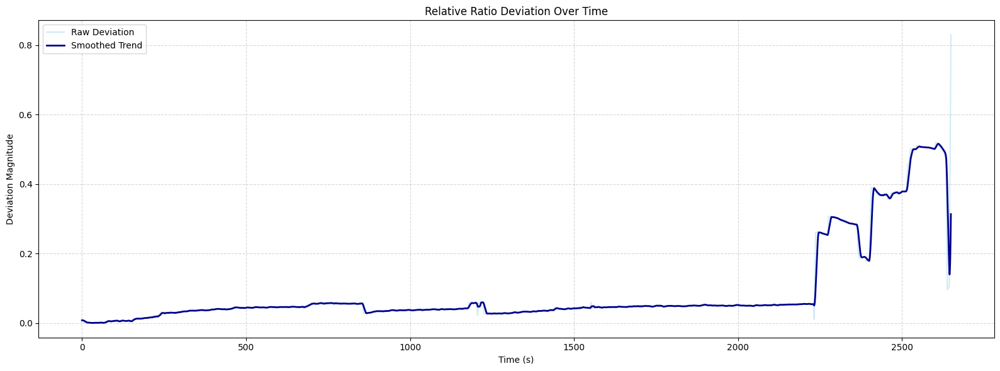

In [749]:
df = rdd_plugs[2]
plot_rdd(df)

In [750]:
df = label_run(df, 2235, 2405, 2515)

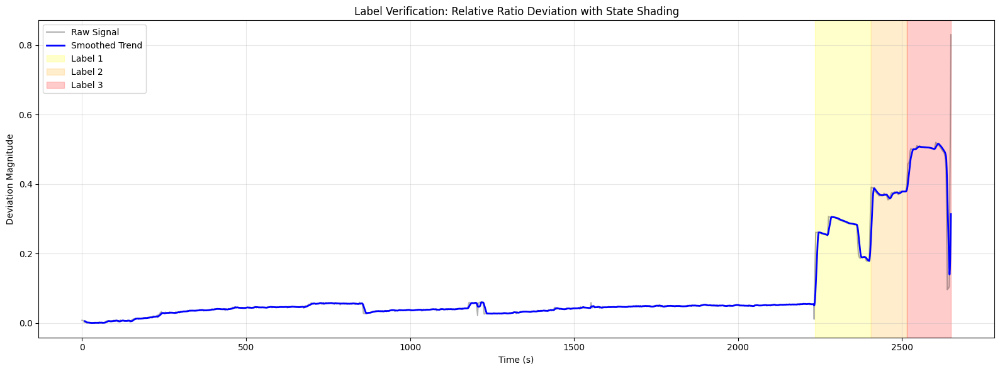

In [751]:
verify_labels(df)

In [752]:
df.to_csv('../data/labeled/plug/2108-2.csv', index=False)

#### 2906-2

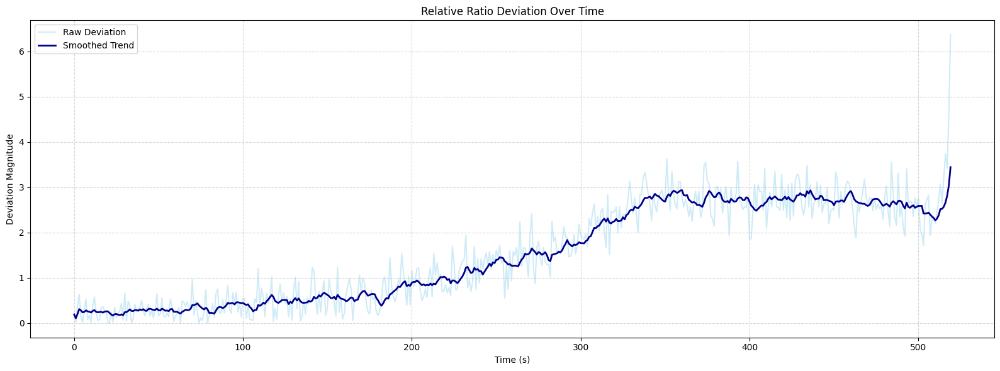

In [753]:
df = rdd_plugs[3]
plot_rdd(df)

In [754]:
df = label_run(df, 70, 180, 340)

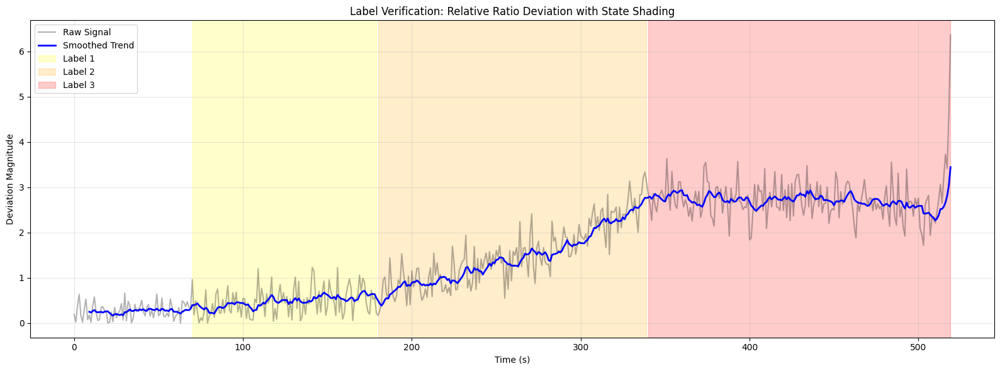

In [755]:
verify_labels(df)

In [756]:
df.to_csv('../data/labeled/plug/2906-2.csv', index=False)

#### 2906-3

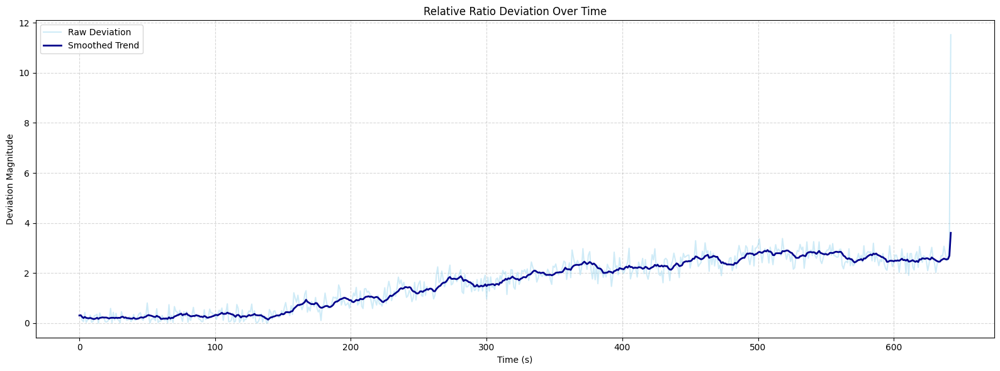

In [757]:
df = rdd_plugs[4]
plot_rdd(df)

In [758]:
df = label_run(df, 140, 240, 475)

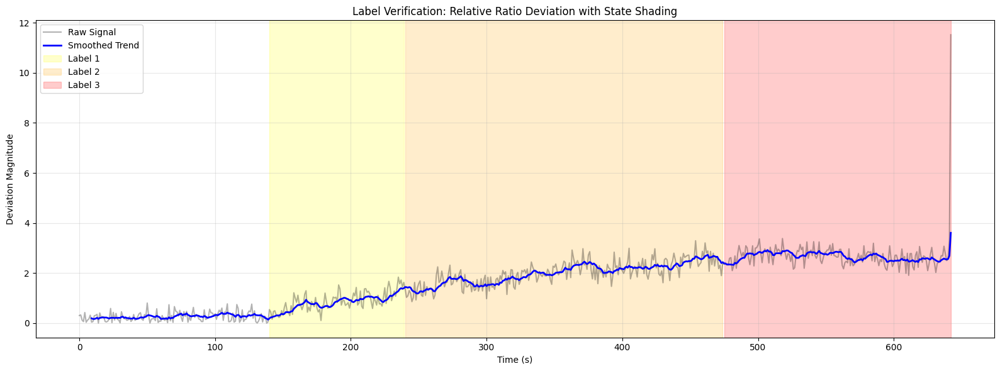

In [759]:
verify_labels(df)

In [760]:
df.to_csv('../data/labeled/plug/2906-3.csv', index=False)

#### 2906-4

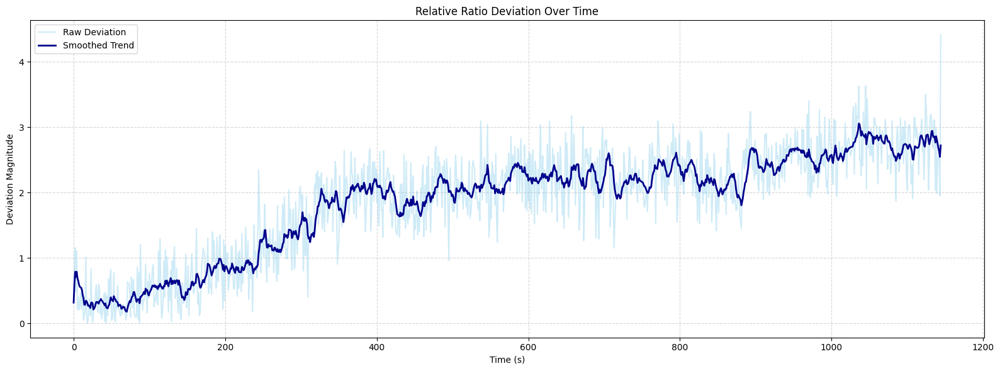

In [761]:
df = rdd_plugs[5]
plot_rdd(df)

In [762]:
df = label_run(df, 80, 240, 580)

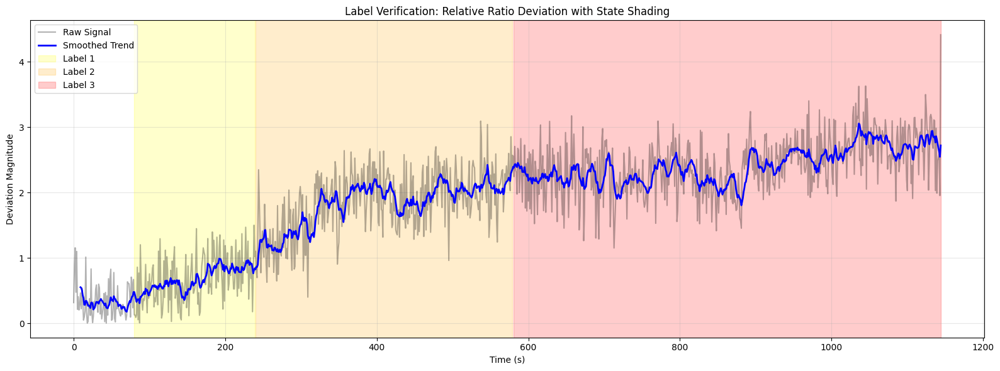

In [763]:
verify_labels(df)

In [764]:
df.to_csv('../data/labeled/plug/2906-4.csv', index=False)

#### 3006-3

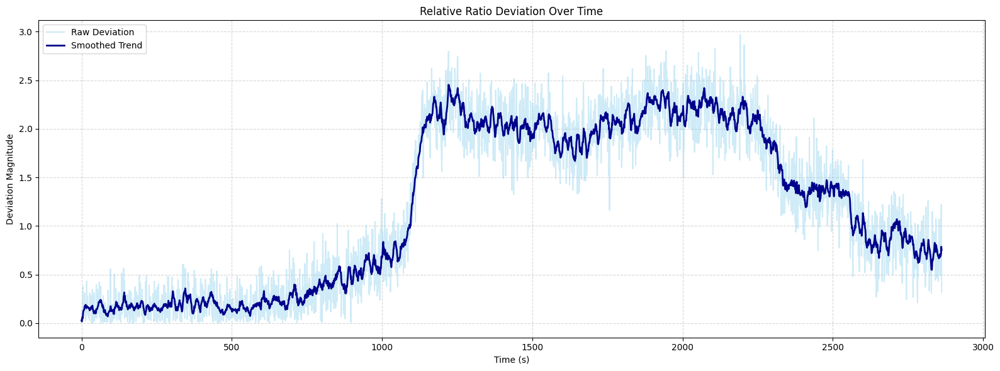

In [765]:
df = rdd_plugs[6]
plot_rdd(df)

In [766]:
df = label_run(df, 680, 1030, 1235)

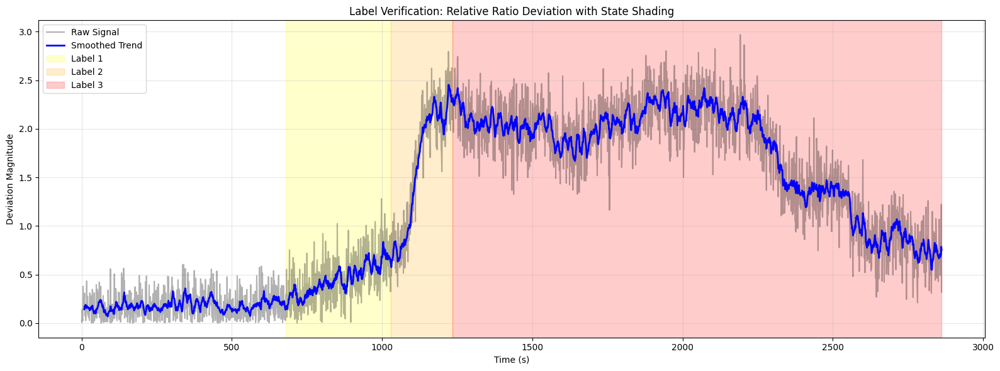

In [767]:
verify_labels(df)

In [768]:
df.to_csv('../data/labeled/plug/3006-3.csv', index=False)

#### 0612-2

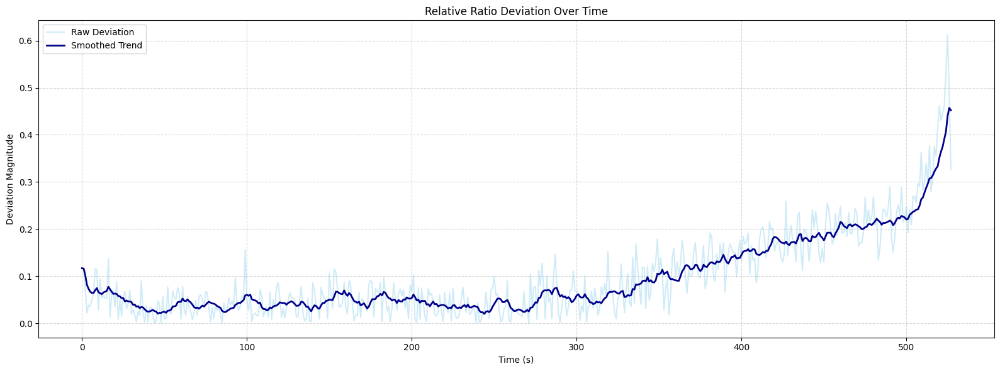

In [769]:
df = rdd_plugs[7]
plot_rdd(df)

In [770]:
df = label_run(df, 310, 410, 500)

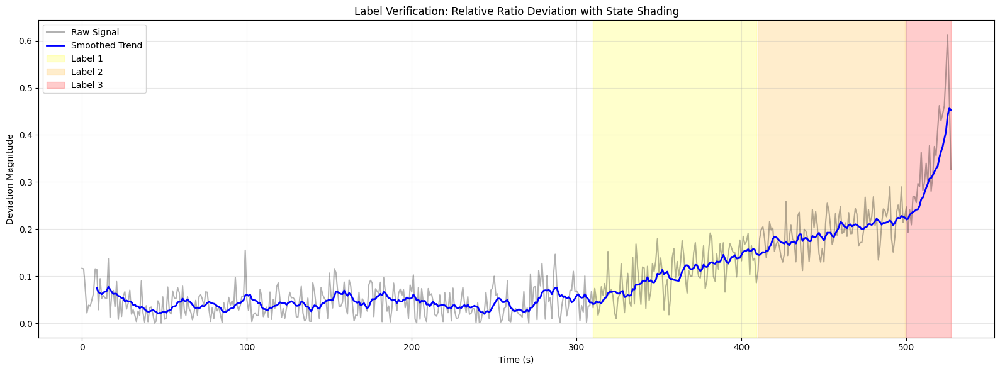

In [771]:
verify_labels(df)

In [772]:
df.to_csv('../data/labeled/plug/0612-2.csv', index=False)

#### 0612-3

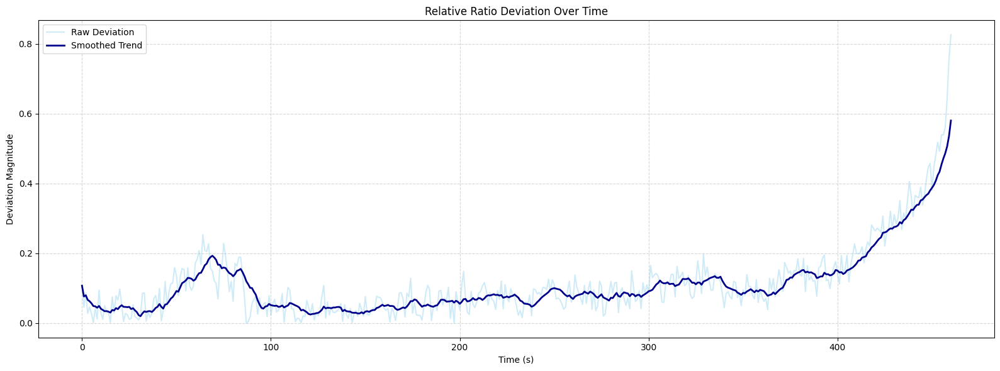

In [773]:
df = rdd_plugs[8]
plot_rdd(df)

In [774]:
df = label_run(df, 240, 365, 420)

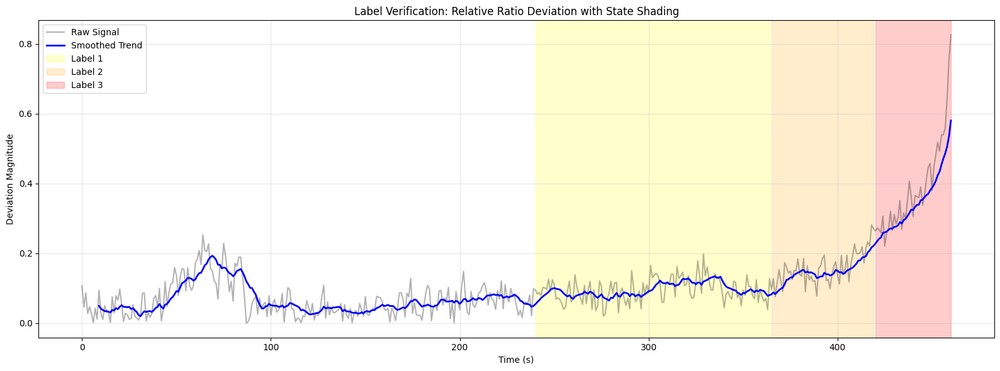

In [775]:
verify_labels(df)

In [776]:
df.to_csv('../data/labeled/plug/0612-3.csv', index=False)

#### 0707-1

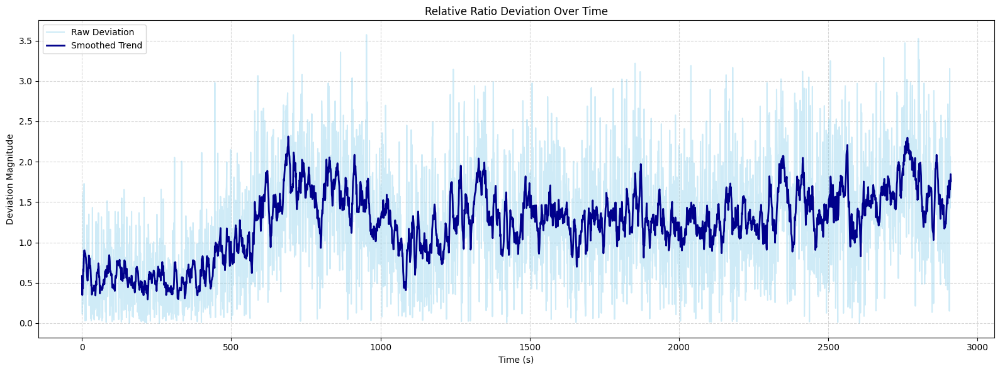

In [777]:
df = rdd_plugs[9]
plot_rdd(df)

In [778]:
df = label_run(df, 400, 550, 1100)

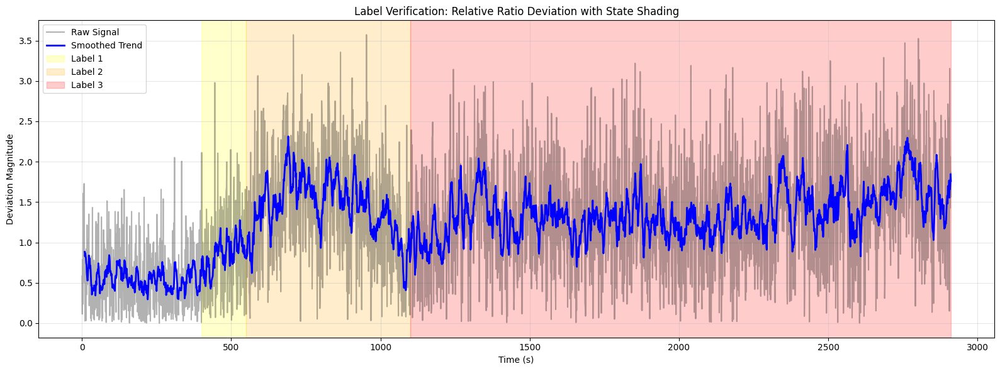

In [779]:
verify_labels(df)

In [780]:
df.to_csv('../data/labeled/plug/0707-1.csv', index=False)

#### 0707-2

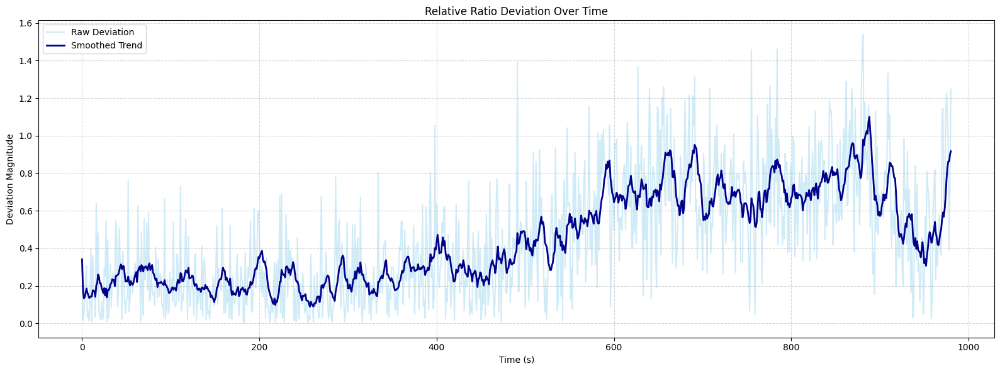

In [781]:
df = rdd_plugs[10]
plot_rdd(df)

In [782]:
df = label_run(df, 360, 530, 860)

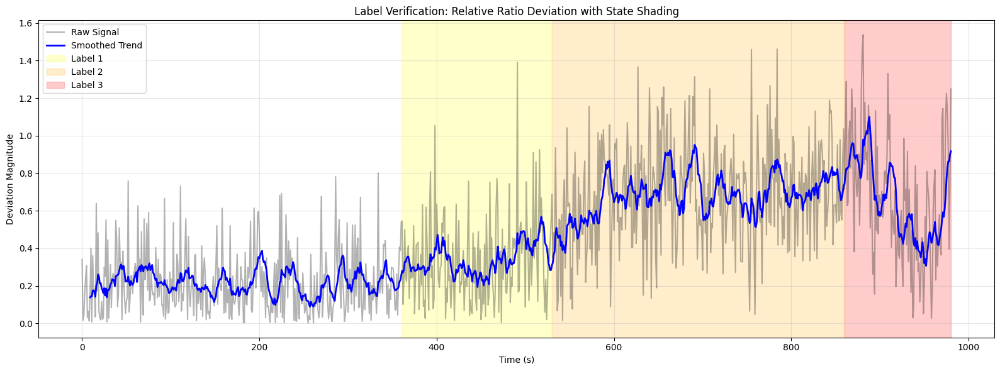

In [783]:
verify_labels(df)

In [784]:
df.to_csv('../data/labeled/plug/0707-2.csv', index=False)

#### 0707-4

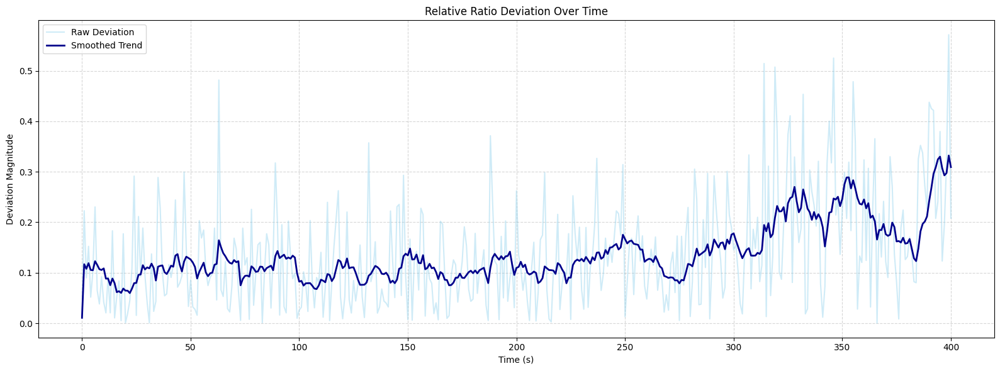

In [785]:
df = rdd_plugs[11]
plot_rdd(df)

In [786]:
df = label_run(df, 275, 315, 385)

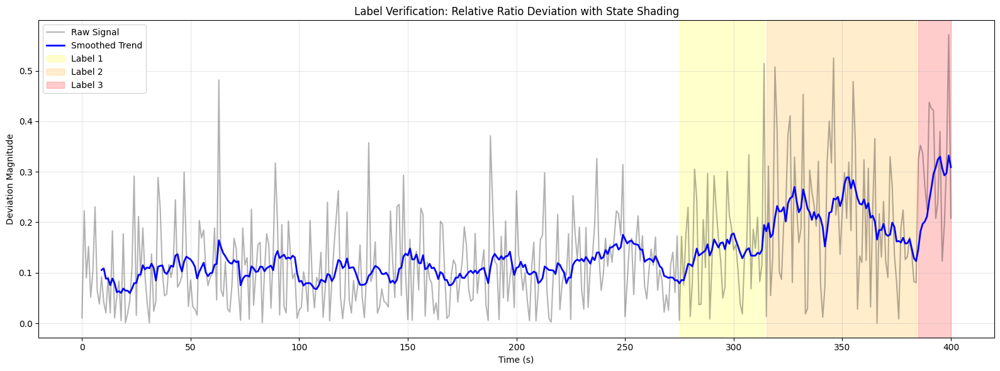

In [787]:
verify_labels(df)

In [788]:
df.to_csv('../data/labeled/plug/0707-4.csv', index=False)

#### 1112

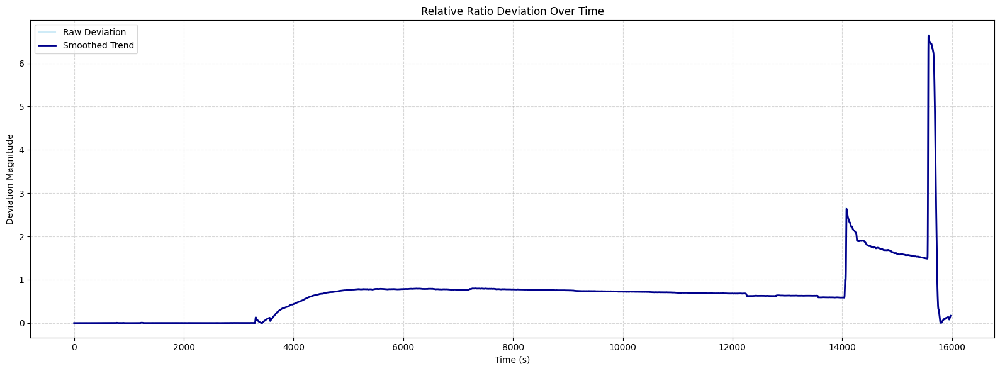

In [789]:
df = rdd_plugs[12]
plot_rdd(df)

In [790]:
df = label_run(df, 3300, 3700, 14000)

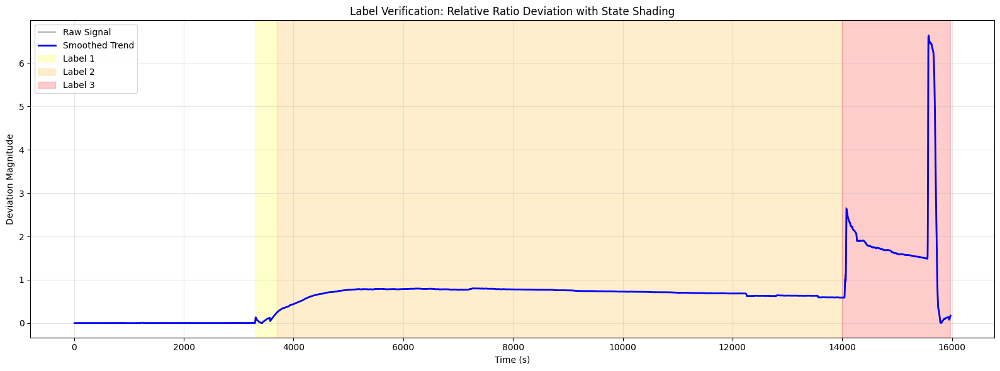

In [791]:
verify_labels(df)

In [792]:
df.to_csv('../data/labeled/plug/1112.csv', index=False)

#### 1310-2

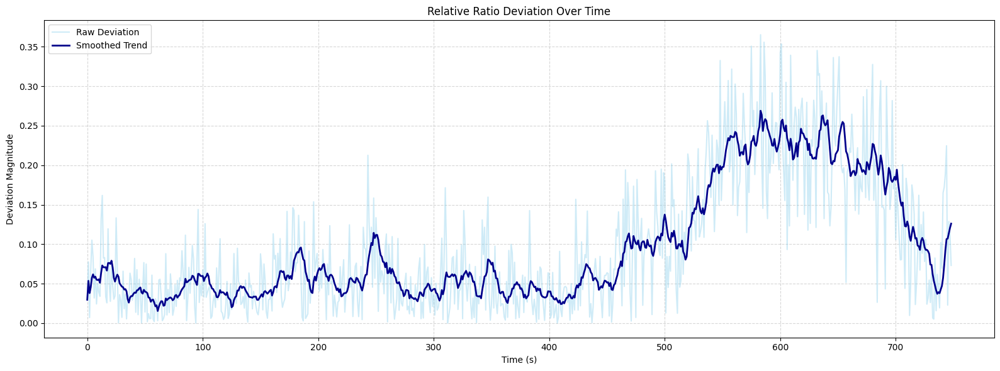

In [793]:
df = rdd_plugs[13]
plot_rdd(df)

In [794]:
df = label_run(df, 450, 520, 590)

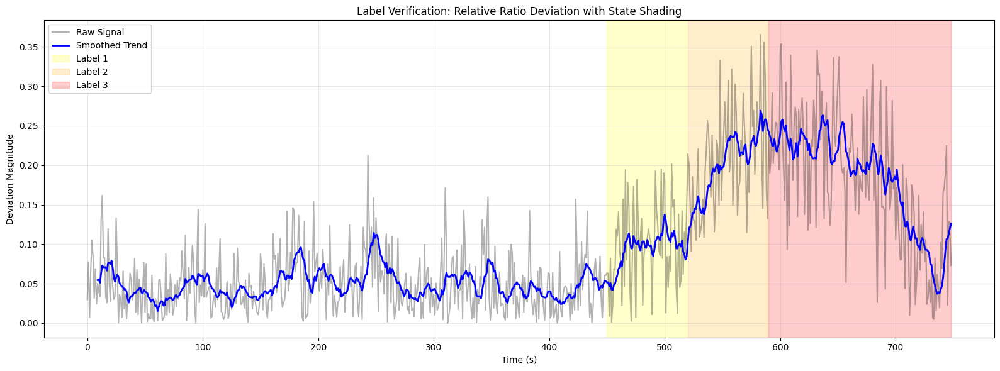

In [795]:
verify_labels(df)

In [796]:
df.to_csv('../data/labeled/plug/1310-2.csv', index=False)

#### 1310-3

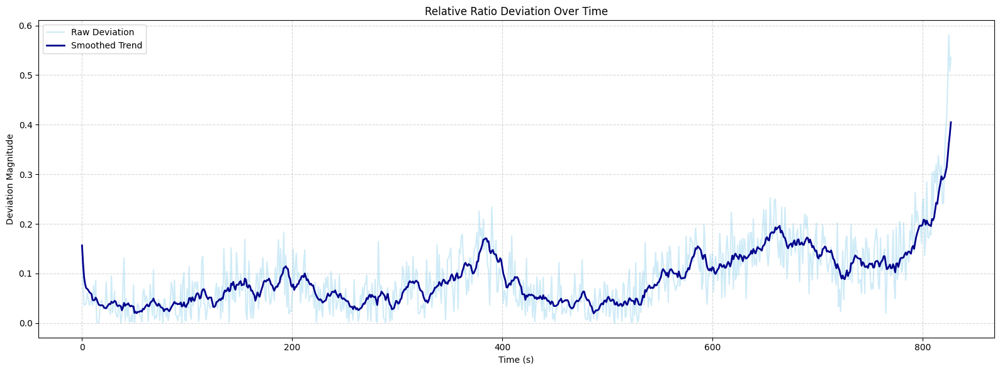

In [797]:
df = rdd_plugs[14]
plot_rdd(df)

In [798]:
df = label_run(df, 330, 540, 730)

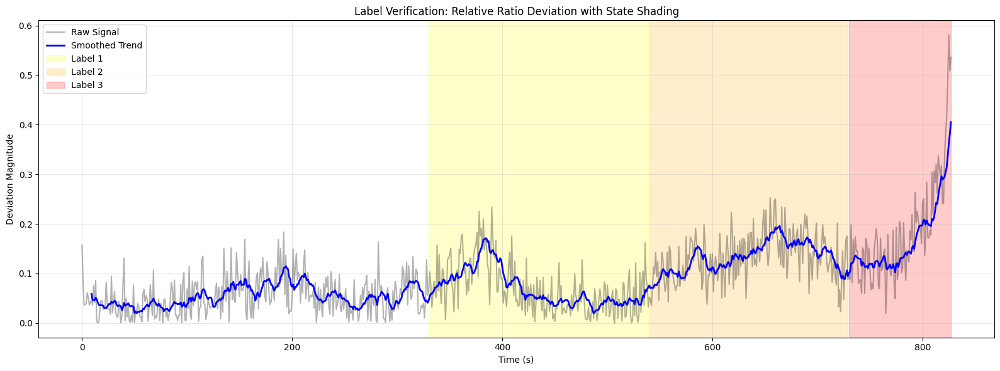

In [799]:
verify_labels(df)

In [800]:
df.to_csv('../data/labeled/plug/1310-3.csv', index=False)

#### 1407-1

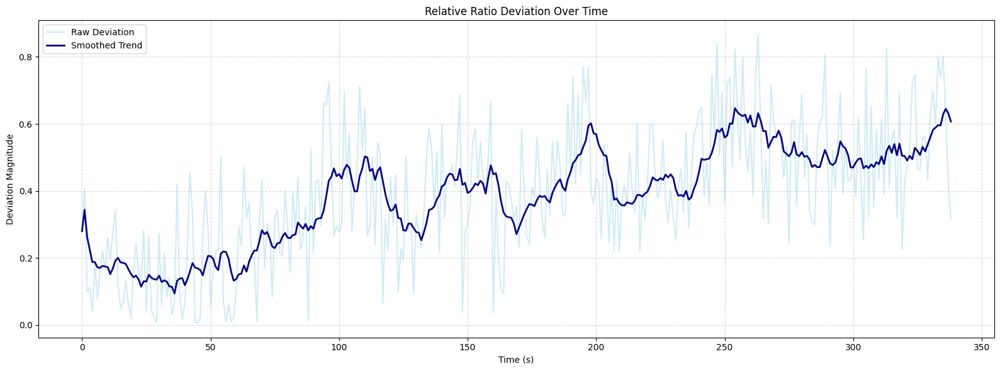

In [801]:
df = rdd_plugs[15]
plot_rdd(df)

In [802]:
df = label_run(df, 85, 135, 240)

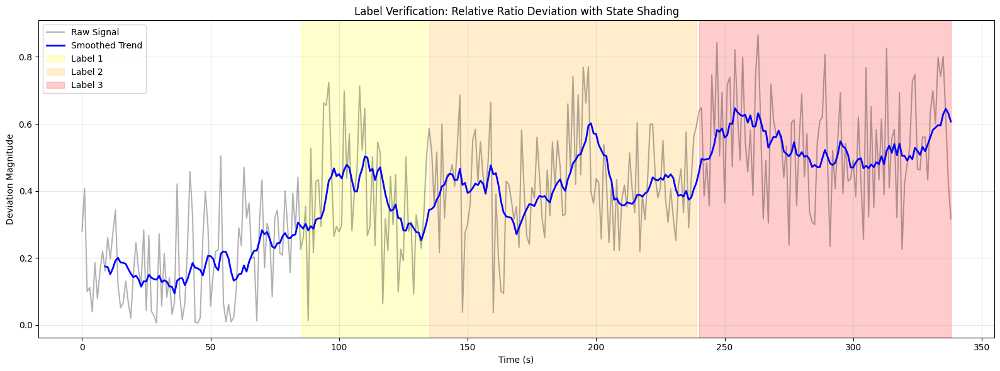

In [803]:
verify_labels(df)

In [804]:
df.to_csv('../data/labeled/plug/1407-1.csv', index=False)

#### 1407-2

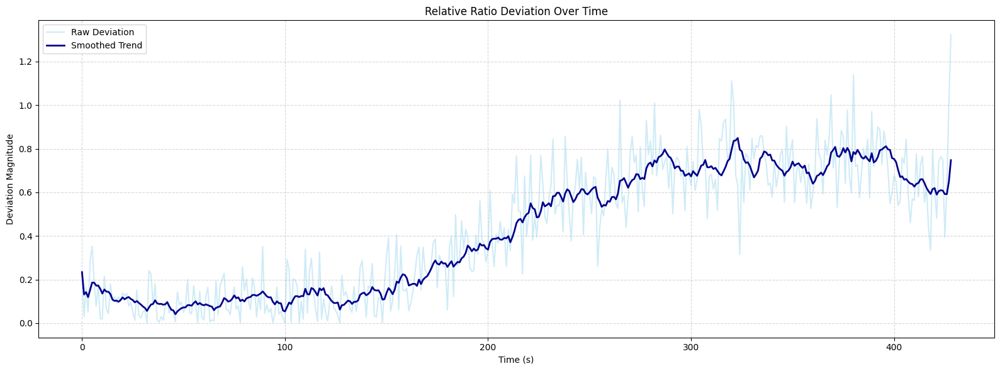

In [805]:
df = rdd_plugs[16]
plot_rdd(df)

In [806]:
df = label_run(df, 145, 215, 315)

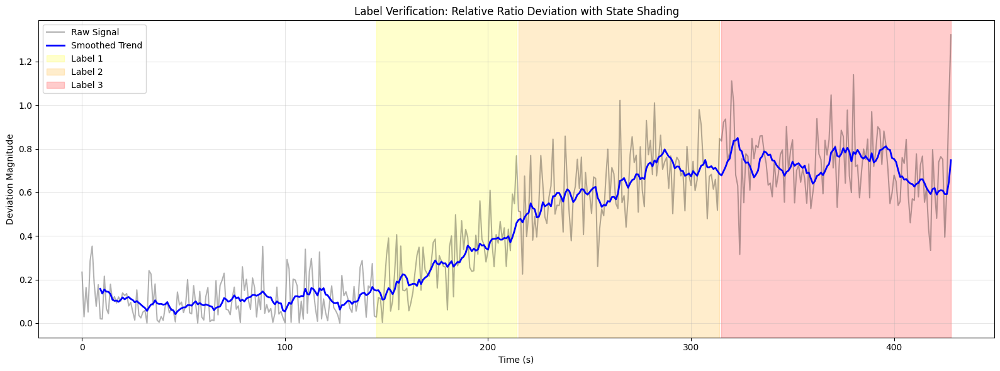

In [807]:
verify_labels(df)

In [808]:
df.to_csv('../data/labeled/plug/1407-2.csv', index=False)

#### 1407-3

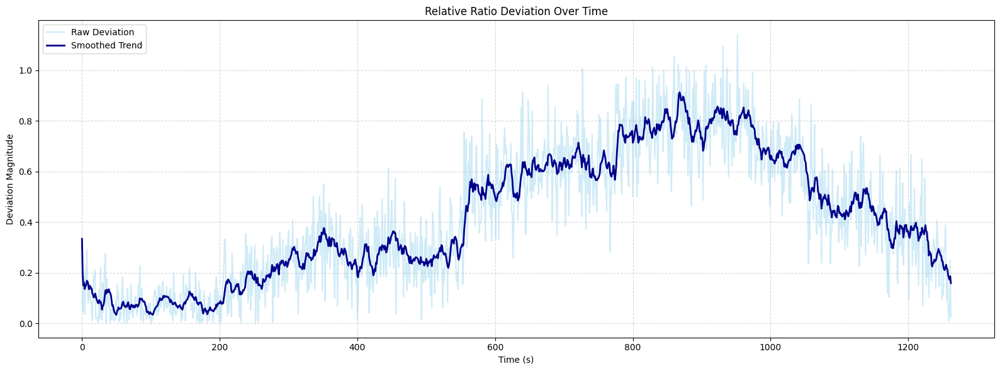

In [809]:
df = rdd_plugs[17]
plot_rdd(df)

In [810]:
df = label_run(df, 200, 550, 850)

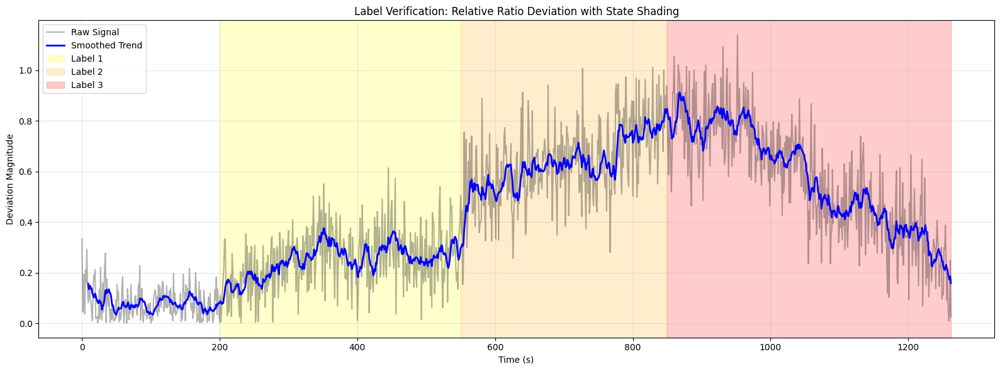

In [811]:
verify_labels(df)

In [812]:
df.to_csv('../data/labeled/plug/1407-3.csv', index=False)

#### 1407-4

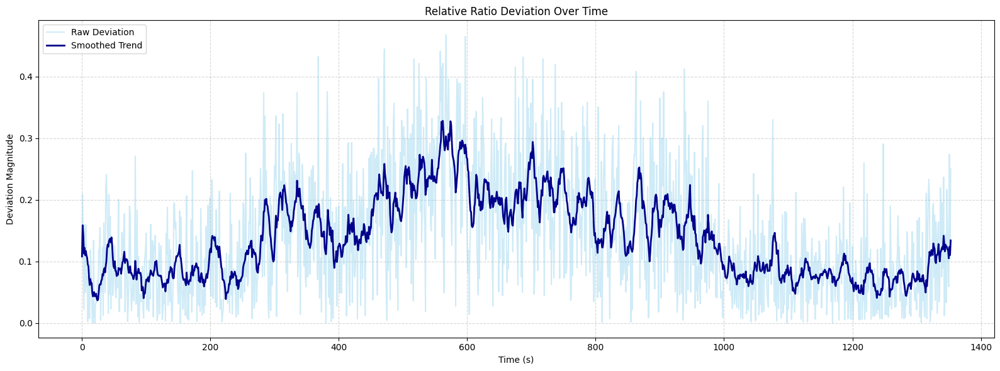

In [813]:
df = rdd_plugs[18]
plot_rdd(df)

In [814]:
df = label_run(df, 260, 440, 550)

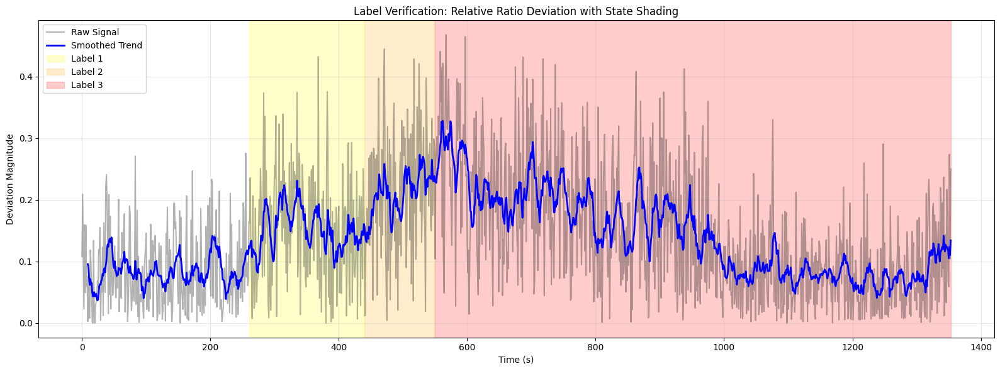

In [815]:
verify_labels(df)

In [816]:
df.to_csv('../data/labeled/plug/1407-4.csv', index=False)

#### 1503

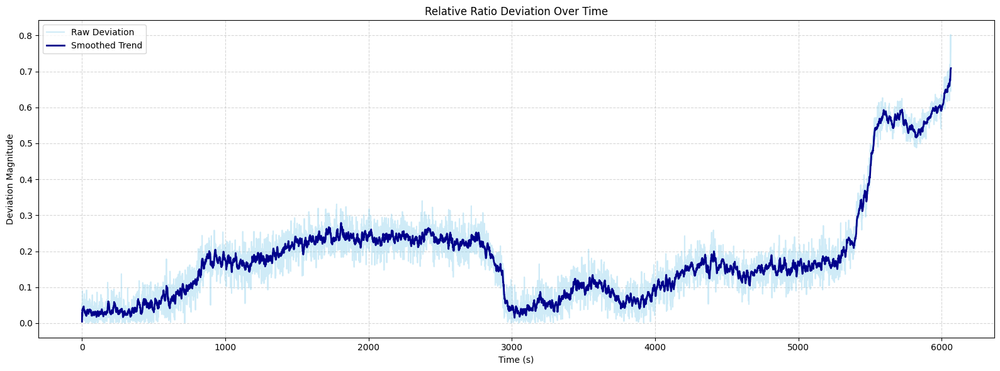

In [817]:
df = rdd_plugs[19]
plot_rdd(df)

In [818]:
df = label_run(df, 750, 1400, 5400)

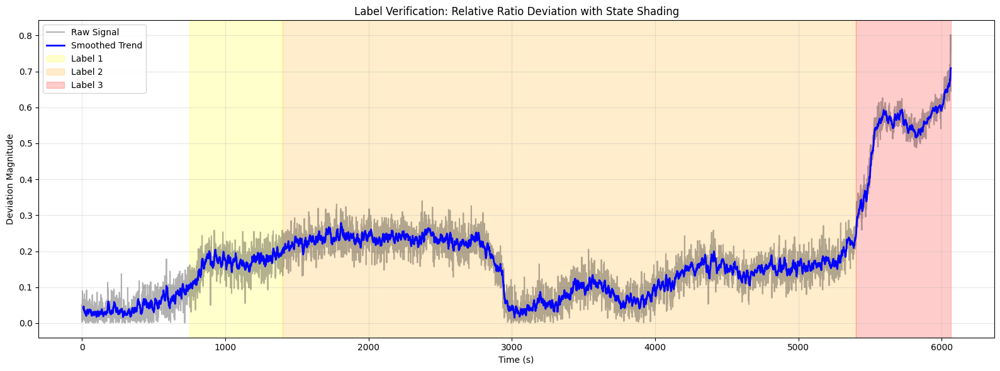

In [819]:
verify_labels(df)

In [820]:
df.to_csv('../data/labeled/plug/1503.csv', index=False)

#### 1811

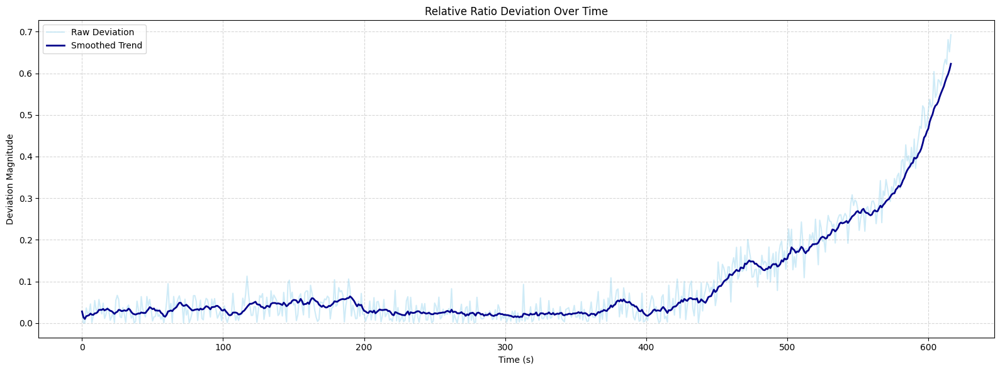

In [821]:
df = rdd_plugs[20]
plot_rdd(df)

In [822]:
df = label_run(df, 370, 480, 580)

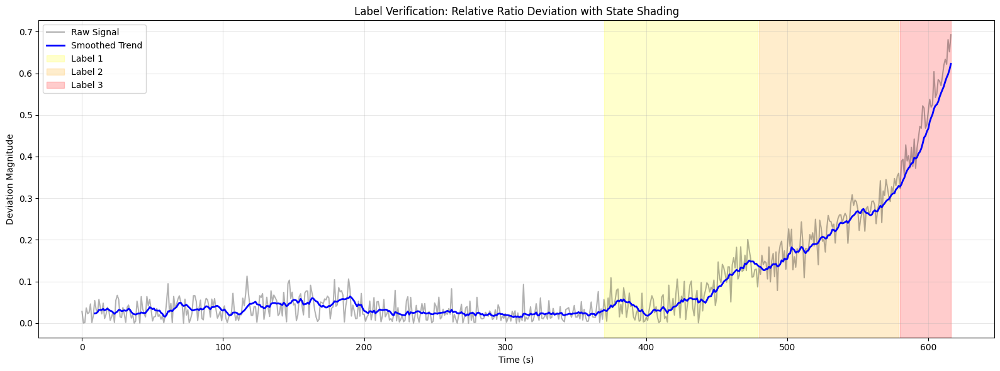

In [823]:
verify_labels(df)

In [824]:
df.to_csv('../data/labeled/plug/1811.csv', index=False)

#### 2701

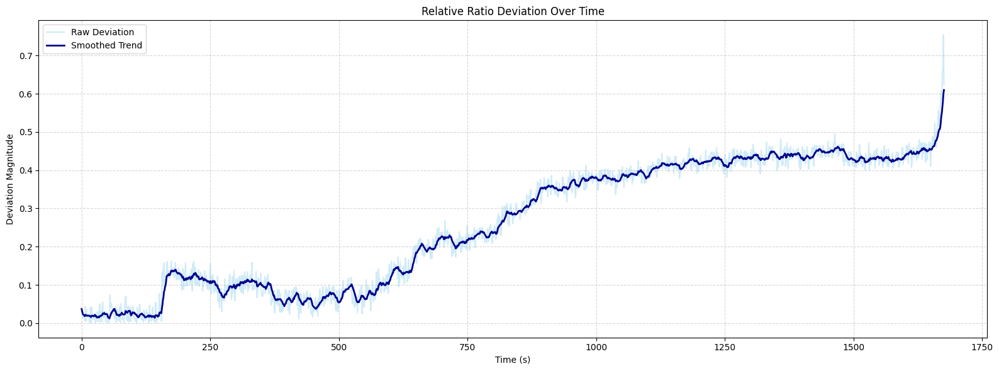

In [825]:
df = rdd_plugs[21]
plot_rdd(df)

In [826]:
df = label_run(df, 160, 625, 1490)

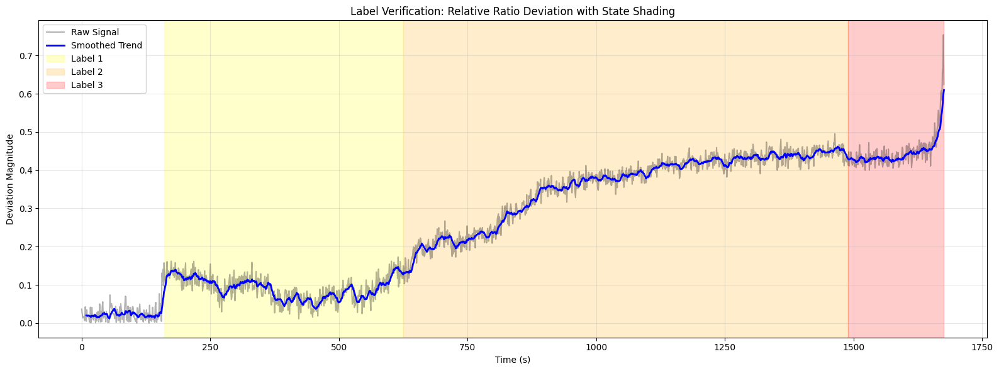

In [827]:
verify_labels(df)

In [828]:
df.to_csv('../data/labeled/plug/2701.csv', index=False)

#### 1003

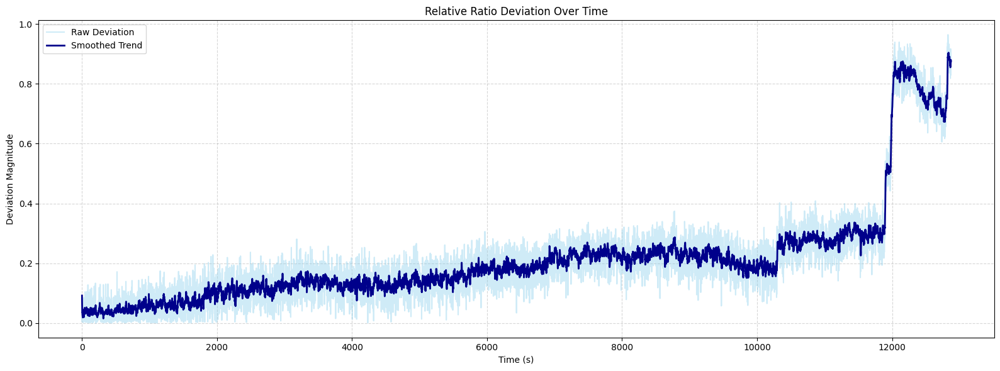

In [829]:
df = rdd_plugs[22]
plot_rdd(df)

In [830]:
df = label_run(df, 5500, 10260, 11950)

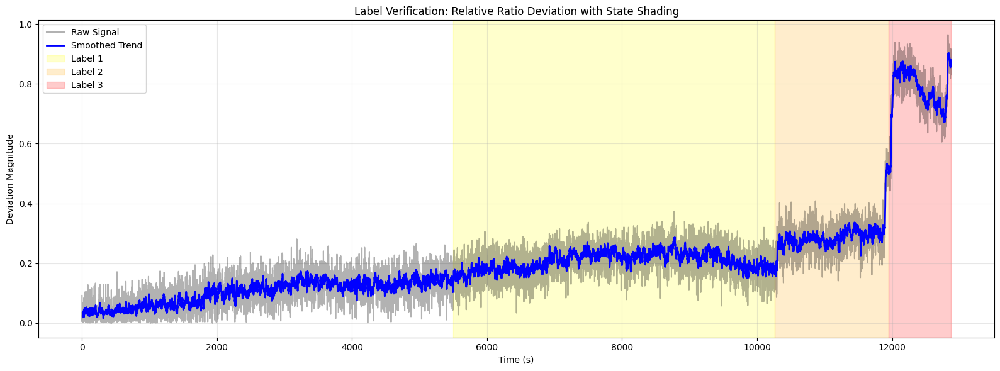

In [831]:
verify_labels(df)

In [832]:
df.to_csv('../data/labeled/plug/1003.csv', index=False)

### Partial plug runs

In [833]:
rdd_partial_plugs = []
for df in standardized_partial_plugs:
    rdd_partial_plugs.append(add_rdd(df))

#### 1803

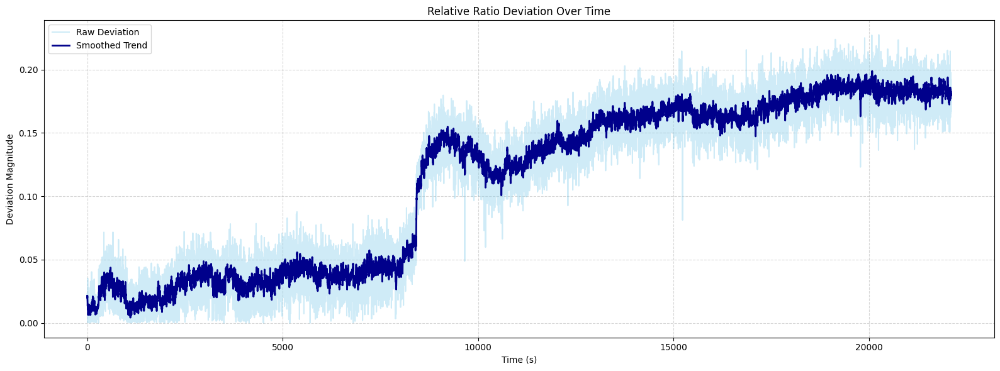

In [834]:
df = rdd_partial_plugs[0]
plot_rdd(df)

In [835]:
df = label_run(df, 7800, 12500, 0)

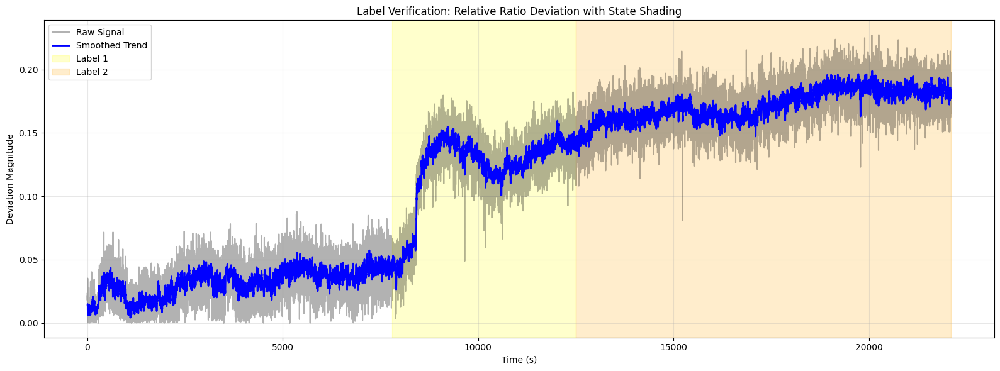

In [836]:
verify_labels(df)

In [837]:
df.to_csv('../data/labeled/partial_plug/1803.csv', index=False)

#### 1103

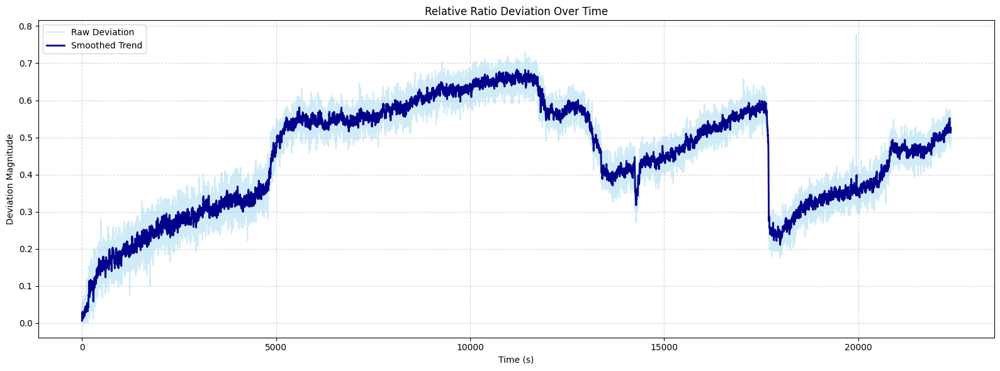

In [838]:
df = rdd_partial_plugs[1]
plot_rdd(df)

In [839]:
df = label_run(df, 500, 4800, 0)

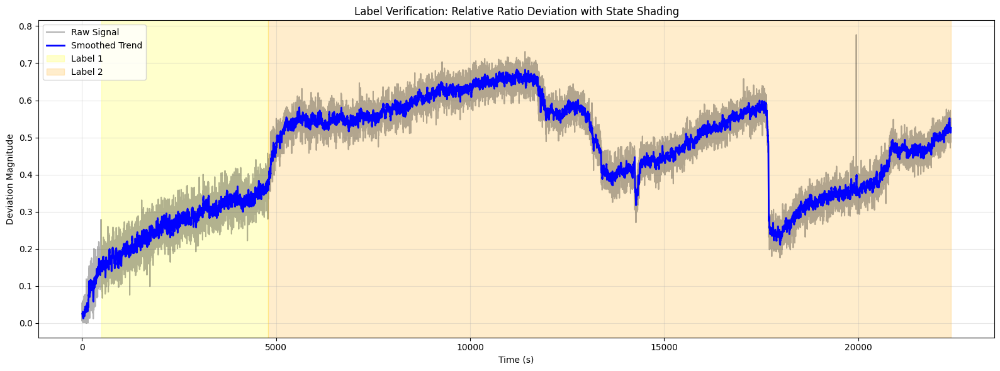

In [840]:
verify_labels(df)

In [841]:
df.to_csv('../data/labeled/partial_plug/1103.csv', index=False)

#### 2503

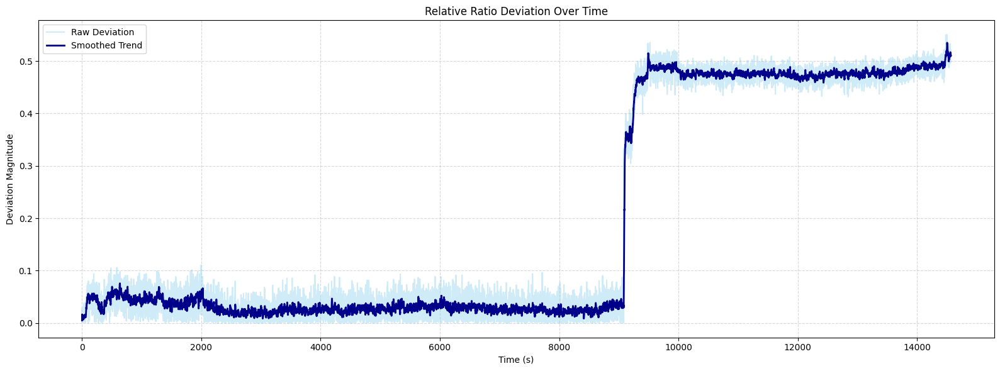

In [842]:
df = rdd_partial_plugs[2]
plot_rdd(df)

In [843]:
df = label_run(df, 8900, 9300, 0)

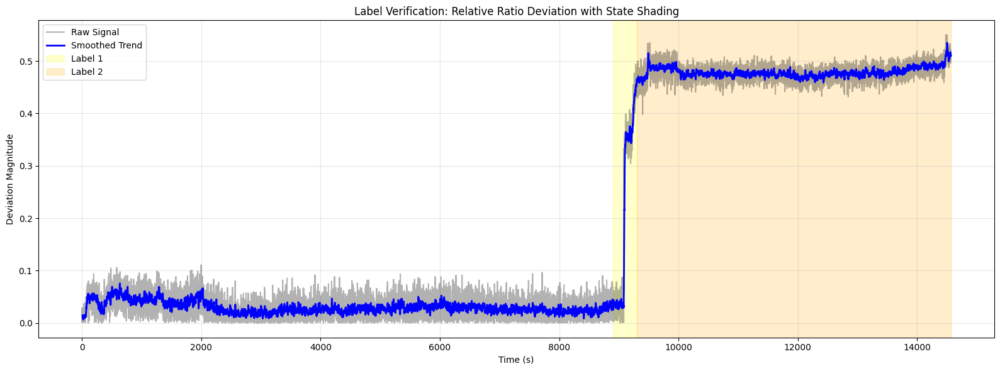

In [844]:
verify_labels(df)

In [845]:
df.to_csv('../data/labeled/partial_plug/2503.csv', index=False)

#### 2108-1

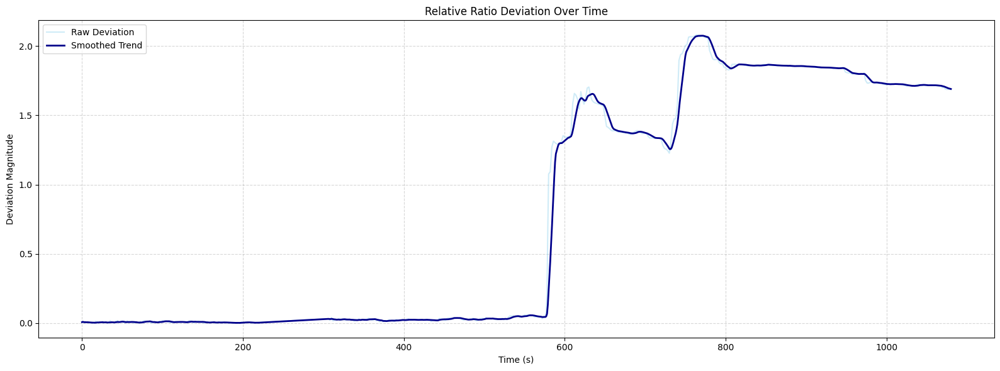

In [846]:
df = rdd_partial_plugs[3]
plot_rdd(df)

In [847]:
df = label_run(df, 570, 730, 0)

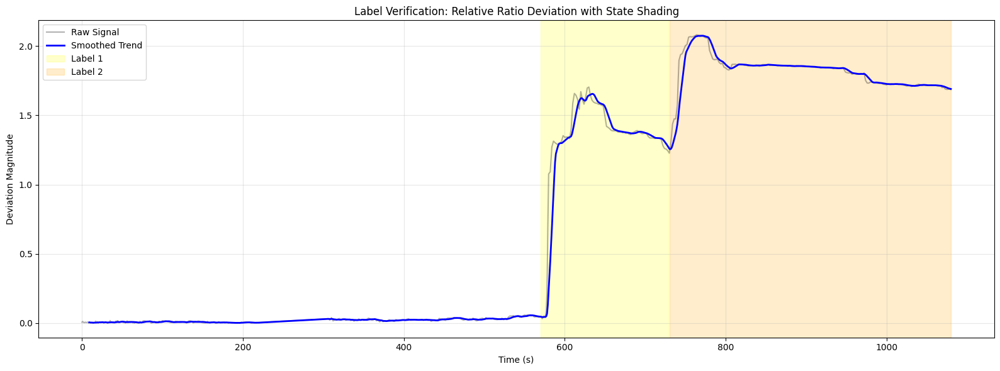

In [848]:
verify_labels(df)

In [849]:
df.to_csv('../data/labeled/partial_plug/2108-1.csv', index=False)

### No plug runs

In [850]:
rdd_no_plugs = []
for df in standardized_no_plugs:
    rdd_no_plugs.append(add_rdd(df))


#### 2906-1

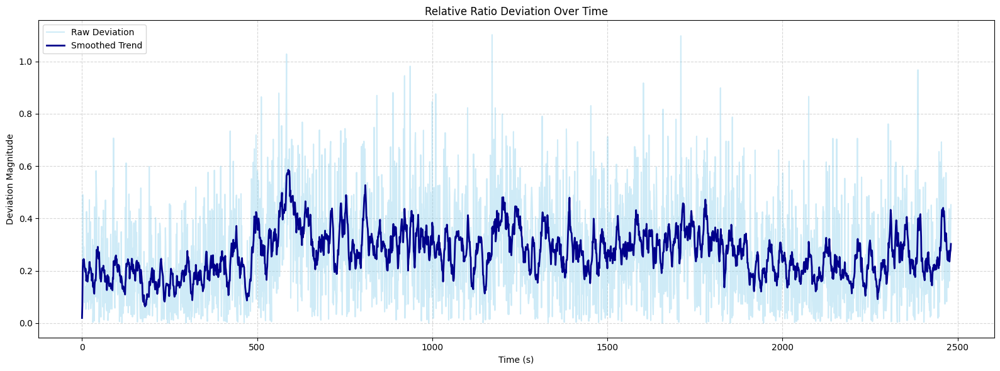

In [851]:
df = rdd_no_plugs[0]
plot_rdd(df)

In [852]:
df = label_run(df, 0, 0, 0)

In [853]:
df.to_csv('../data/labeled/no_plug/2906-1.csv', index=False)

#### 3006-1

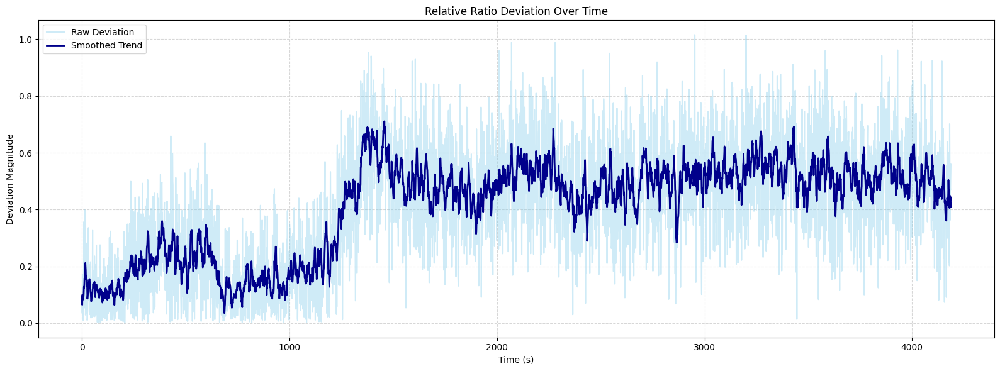

In [854]:
df = rdd_no_plugs[1]
plot_rdd(df)

In [855]:
df = label_run(df, 0, 0, 0)

In [856]:
df.to_csv('../data/labeled/no_plug/3006-1.csv', index=False)

#### 3006-2

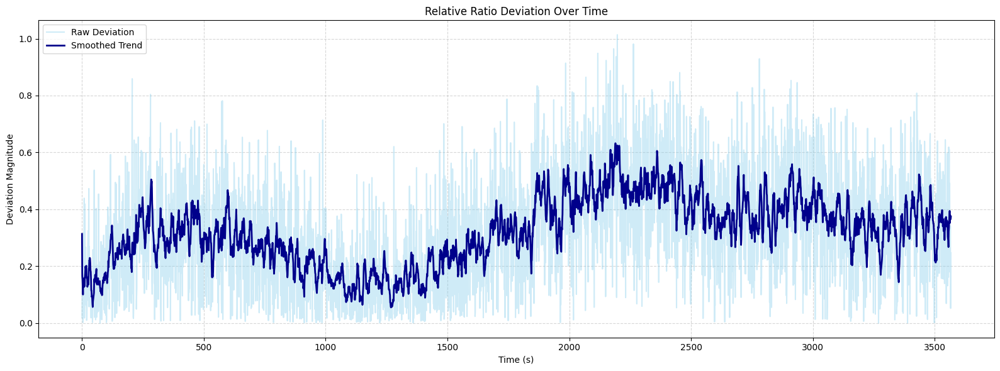

In [857]:
df = rdd_no_plugs[2]
plot_rdd(df)

In [858]:
df = label_run(df, 0, 0, 0)

In [859]:
df.to_csv('../data/labeled/no_plug/3006-2.csv', index=False)

#### 0404

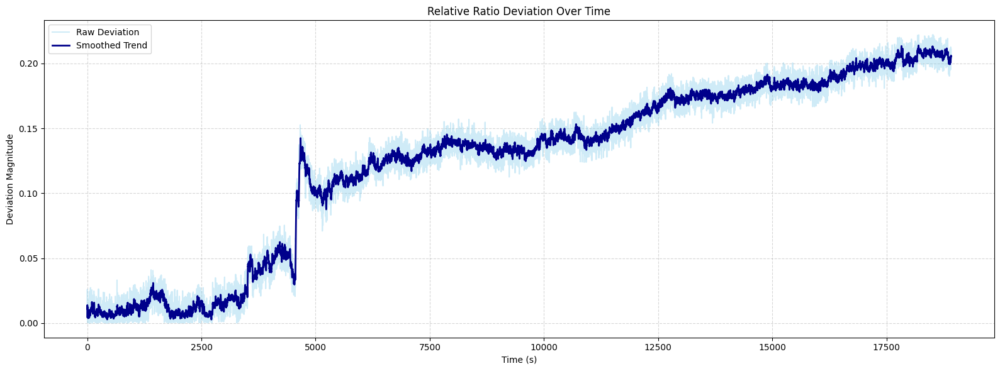

In [860]:
df = rdd_no_plugs[3]
plot_rdd(df)

In [861]:
df = label_run(df, 0, 0, 0)

In [862]:
df.to_csv('../data/labeled/no_plug/0404.csv', index=False)

#### 0712

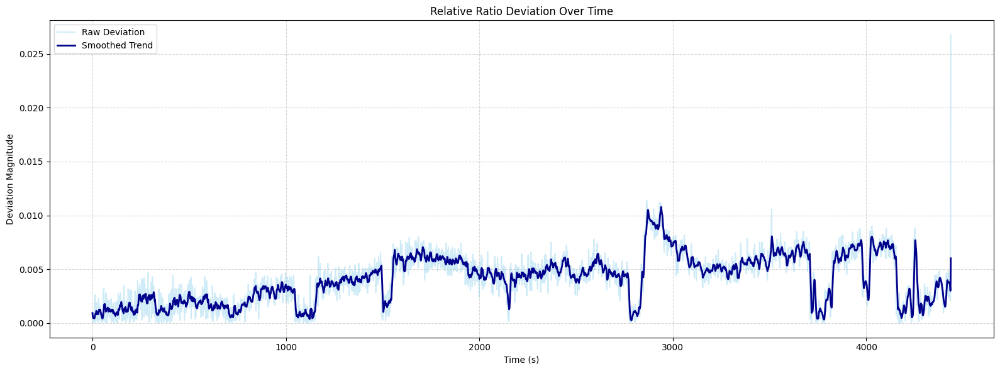

In [863]:
df = rdd_no_plugs[4]
plot_rdd(df)

In [864]:
df = label_run(df, 0, 0, 0)

In [865]:
df.to_csv('../data/labeled/no_plug/0712.csv', index=False)

#### 1703

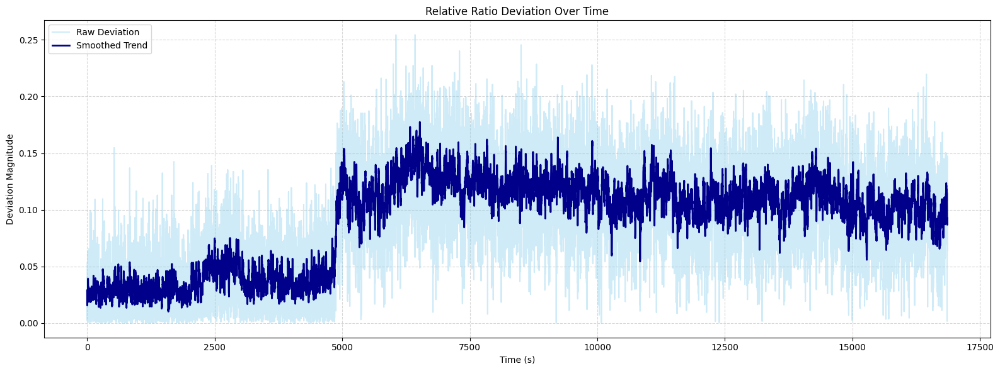

In [866]:
df = rdd_no_plugs[5]
plot_rdd(df)

In [867]:
df = label_run(df, 0, 0, 0)

In [868]:
df.to_csv('../data/labeled/no_plug/1703.csv', index=False)